In [1]:
from uncertainties import ufloat
from uncertainties.umath import *
import math
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from astropy.stats import LombScargle
from scipy import signal
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")
import scipy.optimize
import glob
from astropy.table import Table,join,vstack,unique
from importlib import reload
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import seaborn as sb
import scipy.stats as st
import wotan

import ogle as o #module

blue = 'cornflowerblue'
navy = 'navy'
purple = 'rebeccapurple'
pink = '#CF6275'
maroon = 'maroon'

cross = Table.read('sourcefiles.csv')
full = Table.read('smc_x_m03_zar_match_OGLE_v2.ascii',format='ascii')

summ = pd.read_csv('Feb23_summtab.csv')
alls = pd.read_csv('current_summ.csv') #most updated table from before Feb23 restart

phase = pd.read_csv('Feb23_phasetab.csv')
cross2 = Table.read('part2files.csv')
cross2 = join(cross2,full,keys='src_n')
mlist2 = ['OII I','OIII I','OIV I']
mlist1 = ['OII I','OIII I']

#set plot styles
import matplotlib as mpl
mpl.rcParams['xtick.major.size'] = 9
mpl.rcParams['xtick.major.width'] = 1.2
mpl.rcParams['xtick.minor.size'] = 4
mpl.rcParams['xtick.minor.width'] = 1.2

mpl.rcParams['ytick.major.size'] = 9
mpl.rcParams['ytick.major.width'] = 1.2
mpl.rcParams['ytick.minor.size'] = 4
mpl.rcParams['ytick.minor.width'] = 1.2

mpl.rcParams['xtick.direction'] = 'in'
mpl.rcParams['ytick.direction'] = 'in'

mpl.rcParams['ytick.right'] = True

mpl.rcParams['ytick.minor.visible'] = True
mpl.rcParams['xtick.minor.visible'] = True

mpl.rcParams['xtick.top'] = True

#dictionaries to get new source numbers and names from old source numbers
src_dict = dict(zip(np.array(alls['src_n']), np.array(alls['new src_n'])))
name_dict = dict(zip(np.array(summ['src_n']), np.array(summ['name'])))

# Compare Phase-Folded Data Using Different Periods (X-ray, established from Haberl/Coe, best from periodogram)

- if ToA npz saving fixed, can use that as well

In [52]:
def phase_on_ax(iband,cax,period,label,error=0,pbins=16,det=True,consistent=False):
    if det: yax = 'I detrend'
    else: yax = 'I mag'
    cax.errorbar((iband['MJD-50000']%period)/period,iband[yax],yerr=iband['I mag err'],color=pink,alpha=0.3,ls='none',marker='o',markersize=5,zorder=2)
    cax.errorbar(1+(iband['MJD-50000']%period)/period,iband[yax],yerr=iband['I mag err'],color=pink,alpha=0.3,ls='none',marker='o',markersize=5,zorder=2)
    mid,avg,std = o.meanphase(iband,period,pbins=pbins,det=det,double=True,stdev=True,sterr=True,divide=True)
    if error==0:period_label=f'{period:.2f}'
    else:
        error_decimals = str(error)[::-1].find('.')
        rounded_period = np.round(period,decimals=error_decimals)
        period_label=f'{rounded_period}$\pm${error}'
    if consistent: cax.step(mid,avg,where='mid',color='black',label=f'{label} {period_label}, range {np.nanmax(avg)-np.nanmin(avg):.3f}\nconsistent with X-ray',zorder=3)
    else: cax.step(mid,avg,where='mid',color='black',label=f'{label} {period_label}, range {np.nanmax(avg)-np.nanmin(avg):.3f}',zorder=3)
    #add errors as one sigma
    cax.errorbar(mid,avg,yerr=std,color='black',marker='',linestyle='none',alpha=0.5,zorder=4)
    maxa,mina = np.nanmax(avg)+std[np.nanargmax(avg)],np.nanmin(avg)-std[np.nanargmin(avg)]
    cax.set_ylim(maxa+.01,mina-.01)
    cax.legend(fontsize=11)

In [53]:
def compare_all_phase(src,window=400,btol=50,pbins=16,det=True):
    '''
    src: original source number
    '''
    nsrc = src_dict[src]
    name = name_dict[src]
    
    #get I band data and detrend with spline
    try:iband,vband = o.getIV(src,cross,stack=True,plot=False)
    except:iband,vband = o.getIV(src,cross2,mlist=mlist2,stack=True,plot=False) 
    if det: iband = o.splinedetrend(iband,window=window,btol=btol,rettemp=True)
    
    row = summ[summ['src_n']==src].iloc[0]
    haberl = row['est. period']
    if haberl>0:haberl_exists=True
    else: haberl_exists=False
    near_haberl = row['best auto det pd']
    
    coe = row['Coe est. period']
    if np.isnan(coe): coe_exists=False
    else:coe_exists = True
    near_coe = row['best near Coe']
    if haberl_exists and coe_exists and np.abs(haberl-coe)>haberl/10: haberl_coe_far = True
    else: haberl_coe_far = False
    
    xray = row['X-ray period']
    xray_error = row['X-ray period error']
    xray_different = False
    if np.isnan(xray): xray_exists=False
    else:
        xray_exists = True #should only really use when X-ray exists but this way it still runs
        if xray!=haberl and xray!=coe:xray_different=True
        
    gram = row['best 2-200d period']
    
    all_bool = np.array([haberl_exists,coe_exists,xray_exists])
    hcf = np.array([haberl_coe_far])
    xd = np.array([xray_different])
    num_folds = len(all_bool[all_bool]) + len(hcf[hcf]) + len(xd[xd])
    if np.abs(near_haberl-gram)>.01:num_folds+=1
    if num_folds==0: num_folds=1
    if haberl_exists and coe_exists and xray_exists and np.abs(haberl-xray)<.01 and np.abs(coe-xray)<.01: num_folds-=1
    
    fig,ax = plt.subplots(1,num_folds,figsize=(6*num_folds,4))
    if len(str(name))>3:fig.suptitle(f'{name} (Source #{nsrc})',fontsize=14)
    else:fig.suptitle(f'Source #{nsrc}',fontsize=14)
    if num_folds==1:
        phase_on_ax(iband,ax,gram,'periodogram',pbins=pbins,det=det)
        ax.set_xlabel('Phase',fontsize=14)
        ax.set_xlim(0,2)
        ax.set_ylabel('detrended I mag',fontsize=14)
        return
    plt.subplots_adjust(wspace=0.15)
    ax[0].set_ylabel('detrended I mag',fontsize=14)
    for i in range(num_folds):
        ax[i].set_xlabel('Phase',fontsize=14)
        ax[i].set_xlim(0,2)
        
    current_ax = 0   
    consistent=False
    #X-ray period
    if xray_exists:
        phase_on_ax(iband,ax[current_ax],xray,'X-ray',error=xray_error,pbins=pbins,det=det)
        current_ax+=1
        if np.abs(xray-gram)<xray_error:consistent=True
        
    #overall periodogram best
    phase_on_ax(iband,ax[current_ax],gram,'periodogram',pbins=pbins,det=det,consistent=consistent)
    current_ax+=1
    
    #established periods (Haberl, near Haberl, Coe, near Coe if different from near Haberl)
    if haberl_exists and xray_different:
        if np.abs(xray-haberl)<xray_error:consistent=True
        else:consistent=False
        phase_on_ax(iband,ax[current_ax],haberl,'Haberl',consistent=consistent,pbins=pbins,det=det)
        current_ax+=1
        
    if haberl_exists and np.abs(near_haberl-gram)>.01:
        if np.abs(xray-near_haberl)<xray_error:consistent=True
        else:consistent=False
        phase_on_ax(iband,ax[current_ax],near_haberl,'near Haberl',consistent=consistent,pbins=pbins,det=det)
        current_ax+=1
            
    if coe_exists and coe!=xray:
        if np.abs(xray-coe)<xray_error:consistent=True
        else:consistent=False
        phase_on_ax(iband,ax[current_ax],coe,'Coe',pbins=pbins,det=det,consistent=consistent)
        current_ax+=1
        
        if np.abs(near_haberl-near_coe)>.01:
            if np.abs(xray-near_coe)<xray_error:consistent=True
            else:consistent=False
            phase_on_ax(iband,ax[current_ax],near_coe,'near Coe',pbins=pbins,det=det,consistent=consistent)
    


In [56]:
xsources = np.array(summ[np.isnan(summ['X-ray period'])==False]['src_n'])
xsources

array([ 2,  3,  6,  7,  9, 11, 12, 13, 19, 23, 24, 26, 27, 28, 31, 36, 37,
       44, 45, 49, 54, 56, 60])

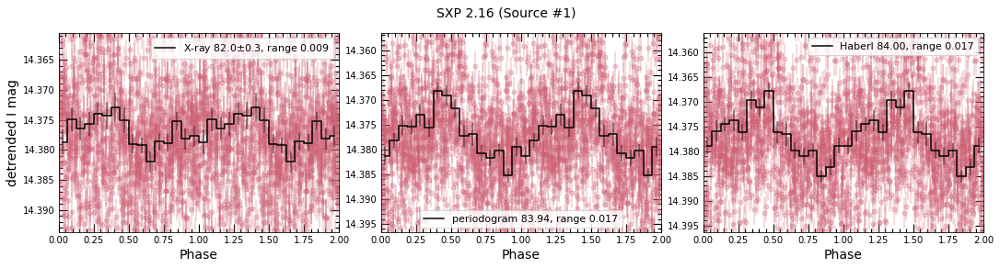

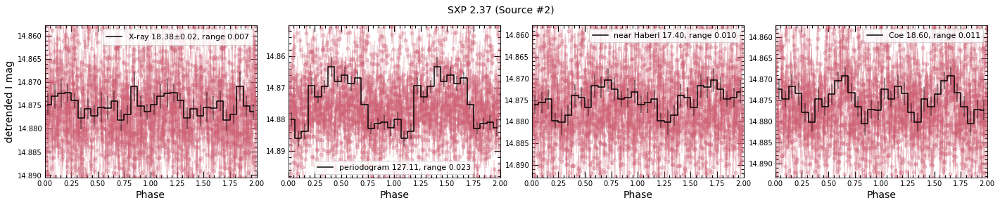

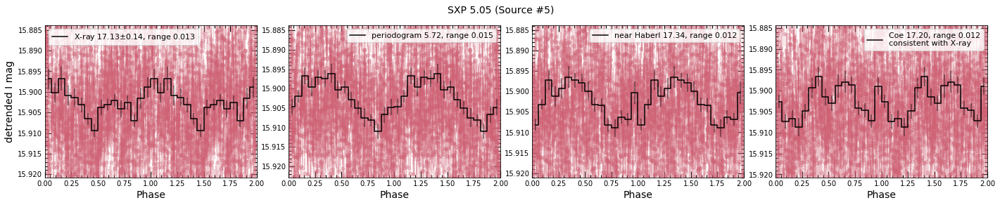

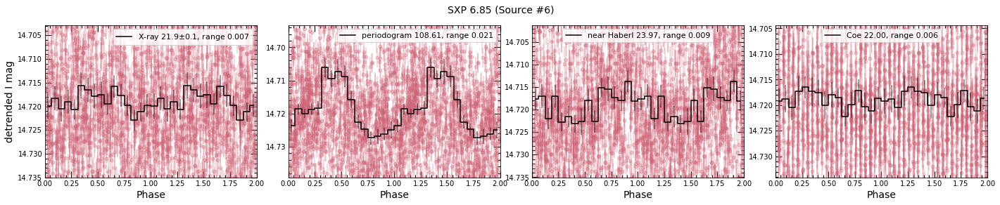

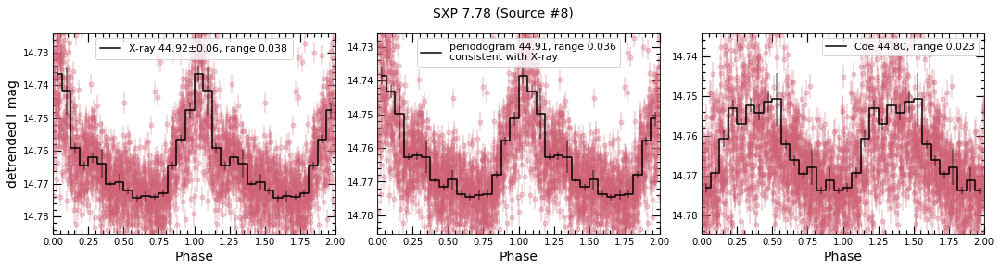

...

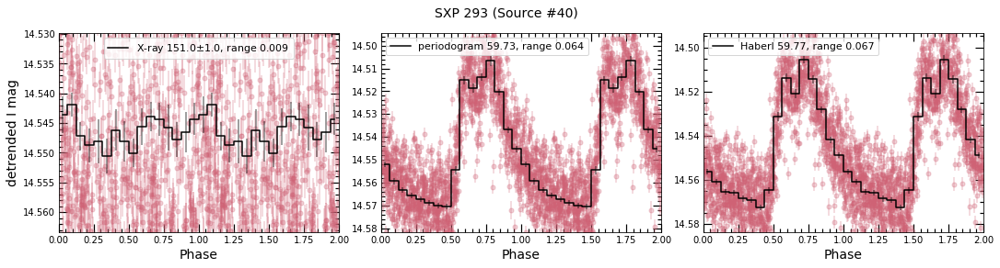

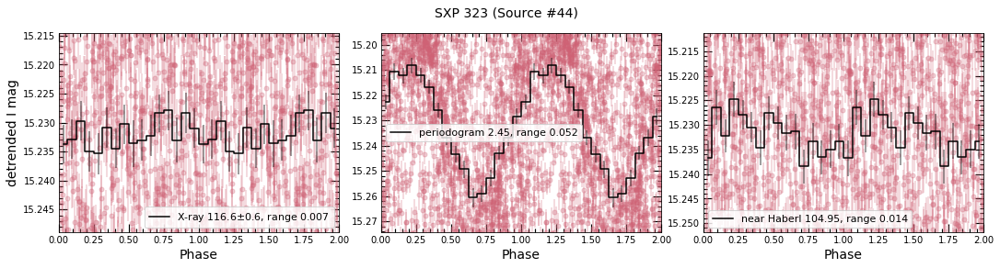

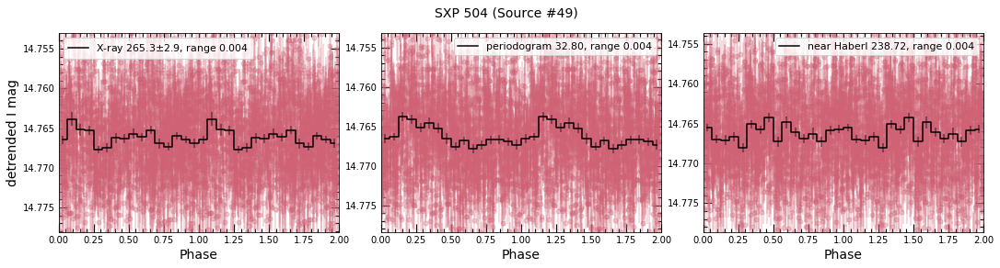

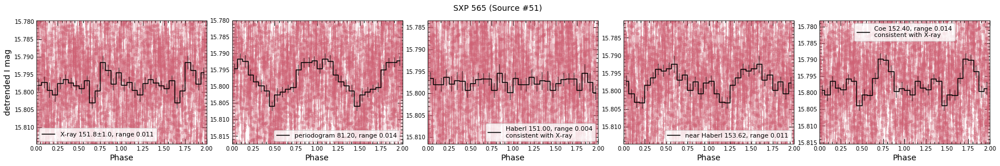

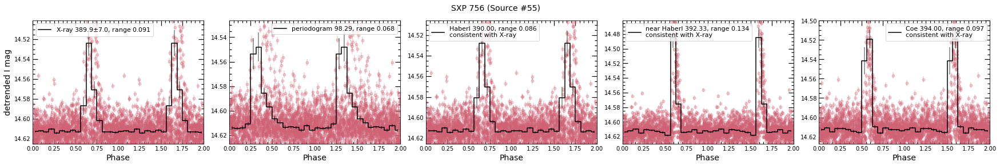

In [57]:
for i in xsources:
    nsrcn = src_dict[i]
    if i==27:compare_all_phase(i,det=False)
    else: compare_all_phase(i)
    plt.savefig(f'ToAFigsFeb23/src{nsrcn}_{i}_folds.pdf',bbox_inches='tight')
    plt.show()